![HACKTIV8](datasets/H8.jpeg)

---
# Capstone Project 2

Nama Anggota:
  1. Oktaviani (PYTN-KS16-002)
  2. Gladis Hafifah (PYTN-KS16-001)
  3. Muhammad Rayhan Assegaf (PYTN-KS16-022)
---

## Introduction
Australia merupakan sebuah negara yang sangat besar dan bervariasi secara geografis, sehingga cuacanya sangat beragam dari suatu wilayah ke wilayah lainnya. mulai dari iklim tropis di wilayah utara australia dengan musim basah pada bulan November hingga April, dan musim kering pada bulan mei hingga oktober. Secara umum negara australia memiliki empat musim diantaranya musim panas dari bulan desember hingga febuari, musim gugur pada bulan maret hingga mei, musim dingin pada bulan juni hingga agustus, dan musim semi pada bulan september hingga november.

"WeatherAUS" adalah sekumpulan data yang berisikan pengamatan cuaca harian yang ada disetiap wilayah negara australia, selama sekitar 10 tahun, Dataset ini mencangkup aspek cuaca seperti, kelembaban, suhu, curah hujan, cakupan awan, dan perkiraan cuaca. Ada 145460 entries dalam dataset ini dengan 23 atribut yang mencangkup informasi tentang cuaca harian.

Atribut "RainTomorrow" adalah target variabel dalam dataset ini. Jika nilainya adalah "Yes," itu berarti bahwa besok kemungkinan akan turun hujan. Dataset ini bermanfaat untuk analisis cuaca, pemodelan cuaca, dan pengembangan sistem peramalan cuaca. Sumber dataset ini adalah platform Kaggle, yang merupakan sumber data yang populer untuk berbagai proyek analisis data dan pembelajaran mesin.

This dataset contains:
- Date: tanggal hari itu.
- Location: lokasi, nama kota di Australia.
- MinTemp: temperatur terendah hari itu dalam celcius.
- MaxTemp: temperatur tertinggi hari itu dalam celcius.
- Rainfall: jumlah curah hujan hari itu dalam mm.
- Evaporation: jumlah evaporasi dalam mm dari Class A pan selama 24 jam sebelum jam 9 pagi hari itu.
- Sunshine: jumlah jam hari itu cerah dengan cahaya matahari.
- WindGustDir: arah kecepatan angin yang paling tinggi selama 24 jam sebelum jam 12 malam hari itu.
- WindGustSpeed: kecepatan angin yang paling tinggi dalam km/jam selama 24 jam sebelum jam 12 malam hari itu.
- WindDir9am: arah angin jam 9 pagi.
- WindDir3pm: arah angin jam 3 sore.
- WindSpeed9am: kecepatan angin jam 9 pagi dalam km/jam dihitung dari rata-rata kecepatan angin 10 menit sebelum jam 3 sore.
- WindSpeed3pm: kecepatan angin jam 3 sore dalam km/jam dihitung dari rata-rata kecepatan angin 10 menit sebelum jam 3 sore.
- Humidity9am: humiditas jam 9 pagi dalam persen.
- Humidity3pm: humiditas jam 3 sore dalam persen.
- Pressure9am: tekanan udara jam 9 pagi dalam hpa.
- Pressure3pm: tekanan udara jam 3 sore dalam hpa.
- Cloud9am: persentase langit yang tertutup awan jam 9 pagi. dihitung dalam oktas, unit ⅛, menghitung berapa unit ⅛ dari langit yang tertutup awan. Jika 0, langit cerah, jika 8, langit sepenuhnya tertutup awan.
- Cloud3pm: persentase langit yang tertutup awan jam 3 sore.
- Temp9am: temperatur jam 9 pagi dalam celcius.
- Temp3pm: temperatur jam 3 sore dalam celcius.
- RainToday: apakah hari ini hujan: jika curah hujan 24 jam sebelum jam 9 pagi melebihi 1mm, maka nilai ini adalah 1, jika tidak nilai nya 0.
- RainTomorrow: variable yang mau di prediksi.

### Objective
1. Mampu mempersiapkan data untuk digunakan dalam model Logistic Regression dan SVM
2. Mampu menerapkan logistic regression dan SVM untuk melakukan prediksi cuaca.
3. Dapat mengidentifikasi akurasi analisis logistic regression dan SVM dalam memprediksi cuaca.
4. Dapat meningkatkan performa terhadap model logistic regeression.

---
---

## Import Library

In [ ]:
# Import pustaka yang akan digunakan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

from scipy import stats
from imblearn.over_sampling import SMOTE
from scipy.stats import yeojohnson
from collections import Counter
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

import warnings
warnings.filterwarnings('ignore')

## Data Loading

In [ ]:
df = pd.read_csv('datasets/weatherAUS.csv')

In [ ]:
pd.set_option('display.max.columns', None)
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No


In [ ]:
# Mengkonversi kolom 'Date' menjadi tipe datetime
df['Day'] = pd.to_datetime(df['Date']).dt.day.astype(int)
df['Month'] = pd.to_datetime(df['Date']).dt.month.astype(int)
df['Year'] = pd.to_datetime(df['Date']).dt.year.astype(int)

df = df[['Year'] + [col for col in df.columns if col != 'Year']]
df = df[['Month'] + [col for col in df.columns if col != 'Month']]
df = df[['Day'] + [col for col in df.columns if col != 'Day']]

df = df.drop(columns=['Date'])

In [ ]:
df.head(3)

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2,12,2008,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,3,12,2008,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Day            145460 non-null  int64  
 1   Month          145460 non-null  int64  
 2   Year           145460 non-null  int64  
 3   Location       145460 non-null  object 
 4   MinTemp        143975 non-null  float64
 5   MaxTemp        144199 non-null  float64
 6   Rainfall       142199 non-null  float64
 7   Evaporation    82670 non-null   float64
 8   Sunshine       75625 non-null   float64
 9   WindGustDir    135134 non-null  object 
 10  WindGustSpeed  135197 non-null  float64
 11  WindDir9am     134894 non-null  object 
 12  WindDir3pm     141232 non-null  object 
 13  WindSpeed9am   143693 non-null  float64
 14  WindSpeed3pm   142398 non-null  float64
 15  Humidity9am    142806 non-null  float64
 16  Humidity3pm    140953 non-null  float64
 17  Pressure9am    130395 non-nul

In [ ]:
df.shape

(145460, 25)

---
## Data Cleaning

### Checking Missing Value

In [ ]:
#Mengecheck data dari masing masing atribut apakah terdapat missing value
df.isnull().sum()

Day                  0
Month                0
Year                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [ ]:
#Menampilkan persentase missing value pada masing masing atribut
df.apply(lambda x: f'{((x.isnull().sum()/df.shape[0])*100).round(2)} %')

Day                0.0 %
Month              0.0 %
Year               0.0 %
Location           0.0 %
MinTemp           1.02 %
MaxTemp           0.87 %
Rainfall          2.24 %
Evaporation      43.17 %
Sunshine         48.01 %
WindGustDir        7.1 %
WindGustSpeed     7.06 %
WindDir9am        7.26 %
WindDir3pm        2.91 %
WindSpeed9am      1.21 %
WindSpeed3pm      2.11 %
Humidity9am       1.82 %
Humidity3pm        3.1 %
Pressure9am      10.36 %
Pressure3pm      10.33 %
Cloud9am         38.42 %
Cloud3pm         40.81 %
Temp9am           1.21 %
Temp3pm           2.48 %
RainToday         2.24 %
RainTomorrow      2.25 %
dtype: object

Pada atribut yang memiliki missing value dibawah 5% bisa kita drop saja dan untuk atribut WindGustDir dan WindDir9am kita tidak dapat melakukan imputasi dikarenakan nilai di setiap harinya berubah ubah sehingga akan sulit untuk mengimputasi data yang sesuai.

Lalu untuk atribut yang memiliki missing value diatas 5% bisa kita handle dengan cara melakukan imputasi, imputasi dapat dilakukan dengan menggunakan nilai rata rata (mean) atau nilai tengah (median) dari masing masing atribut, namun untuk melakukan imputasi kita perlu mengetahui terlebih dahulu data tersebut termasuk kedalam distribusi normal atau distribusi skewed, jika menunjukan distribusi normal maka bisa kita gunakan dengan mean, dan jika distribusi skewed menggunakan median.

### Distribusi Data

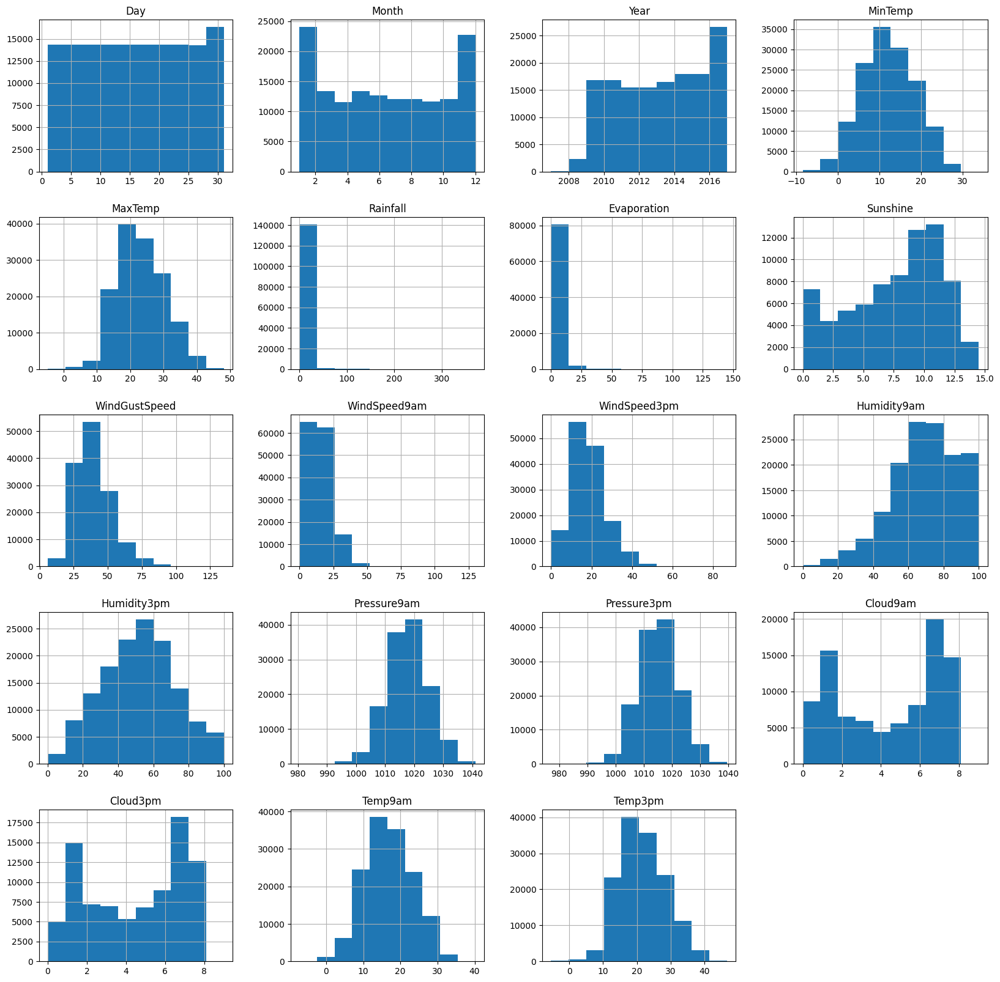

In [ ]:
df.hist(bins=10, figsize=(20,20))
plt.show()

### Handling Missing value

Berdasarkan visualisasi histogram diatas pada atribut evaporation, sunshine, cloud9am, cloud3pm, windgustspeed, pressure9am dan pressure3pm menunjukkan bahwa distribusi atribut tersebut merupakan distribusi tidak normal.

In [ ]:
#Handling missing value
df['Evaporation'].fillna(df['Evaporation'].median(), inplace=True)
df['Sunshine'].fillna(df['Sunshine'].median(), inplace=True)
df['Cloud9am'].fillna(df['Cloud9am'].median(), inplace=True)
df['Cloud3pm'].fillna(df['Cloud3pm'].median(), inplace=True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].median(), inplace=True)
df['Pressure9am'].fillna(df['Pressure9am'].median(), inplace=True)
df['Pressure3pm'].fillna(df['Pressure3pm'].median(), inplace=True)

In [ ]:
data = df.dropna()

In [ ]:
data.isnull().sum()

Day              0
Month            0
Year             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

### Checking Data Duplicated

In [ ]:
data.duplicated().sum()

0

### Split Data

In [ ]:
train, test = train_test_split(data, test_size=0.3, random_state=42)
print('Training set size:', train.shape)
print('Test set size:', test.shape)

Training set size: (85253, 25)
Test set size: (36537, 25)


### Checking Distribusi Numeric

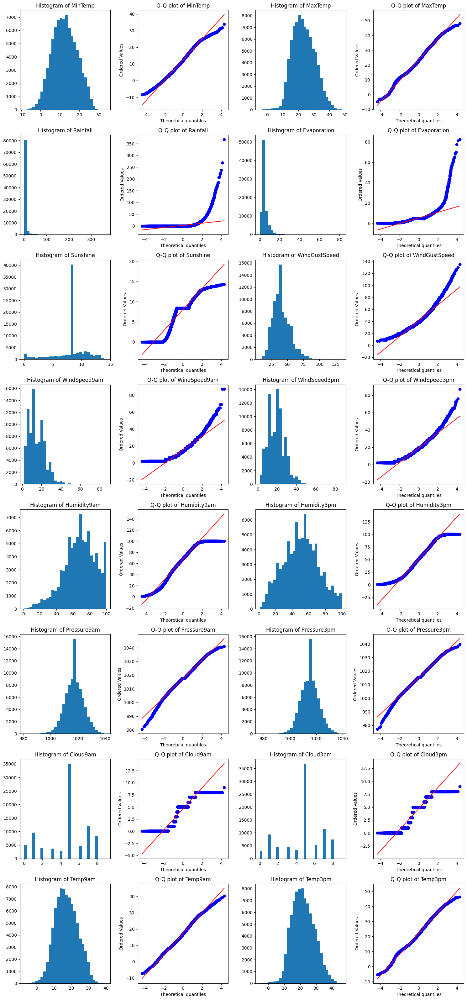

In [ ]:
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

columns_per_row = 4
num_rows = len(numerical_columns) // columns_per_row
if len(numerical_columns) % columns_per_row != 0:
    num_rows += 1

fig, axes = plt.subplots(nrows=num_rows * 2, ncols=columns_per_row, figsize=(15, num_rows * 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    ax = axes[i * 2]
    ax.hist(train[col], bins=30)
    ax.set_title(f'Histogram of {col}')

    ax = axes[i * 2 + 1]
    stats.probplot(train[col], dist="norm", plot=ax)
    ax.set_title(f'Q-Q plot of {col}')

plt.tight_layout()
plt.show()

Pada visualisasi histogram diatas menunjukkan bahwa atribut tersebut memiliki distribusi yang tidak normal, untuk melakukan handling outlier maka diperlukan untuk mentransform data tersebut agar berdistribusi normal atau mendekati normal.

### Transformation Distribusi Numeric

MinTemp is not normally distributed.
MaxTemp is not normally distributed.
Rainfall is not normally distributed.
Evaporation is not normally distributed.
Sunshine is not normally distributed.
WindGustSpeed is not normally distributed.
WindSpeed9am is not normally distributed.
WindSpeed3pm is not normally distributed.
Humidity9am is not normally distributed.
Humidity3pm is not normally distributed.
Pressure9am is not normally distributed.
Pressure3pm is not normally distributed.
Cloud9am is not normally distributed.
Cloud3pm is not normally distributed.
Temp9am is not normally distributed.
Temp3pm is not normally distributed.


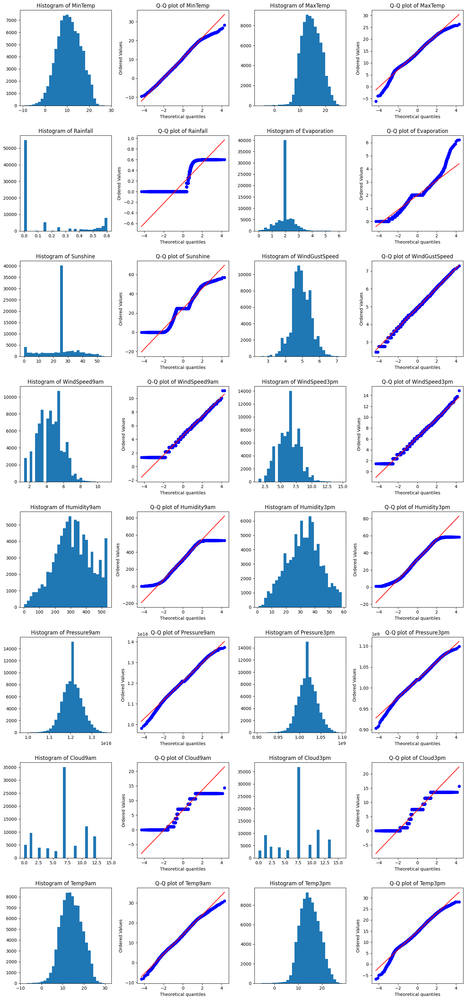

In [ ]:
transformation_params = {}

columns_per_row = 4
num_rows = len(numerical_columns) // columns_per_row
if len(numerical_columns) % columns_per_row != 0:
    num_rows += 1

fig, axes = plt.subplots(nrows=num_rows * 2, ncols=columns_per_row, figsize=(15, num_rows * 8))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    _, p_value = stats.shapiro(train[col])
    if p_value < 0.05:
        print(f'{col} is not normally distributed.')

        # Menerapkan transformasi Yeo-Johnson ke data pelatihan dan menyimpan parameter
        train[col], lambda_value = yeojohnson(train[col])
        transformation_params[col] = lambda_value

    ax = axes[i * 2]
    ax.hist(train[col], bins=30)
    ax.set_title(f'Histogram of {col}')

    ax = axes[i * 2 + 1]
    stats.probplot(train[col], dist="norm", plot=ax)
    ax.set_title(f'Q-Q plot of {col}')

plt.tight_layout()
plt.show()

In [ ]:
for col, lambda_value in transformation_params.items():
    test[col] = yeojohnson(test[col], lmbda=lambda_value)

### Checking Outlier

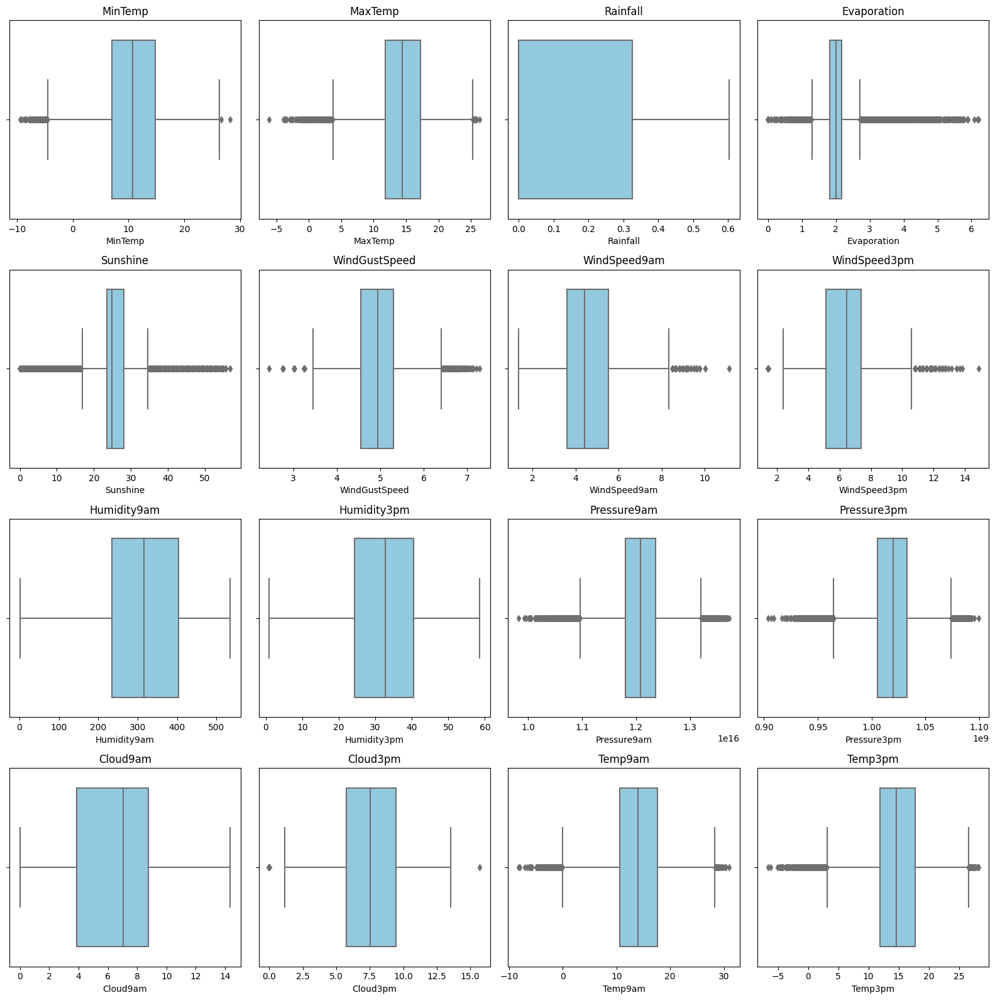

In [ ]:
features = [col for col in numerical_columns]

features_count = len(features)
features_rows = (features_count // 4) + (features_count % 4)
fig, axes = plt.subplots(nrows=features_rows, ncols=4, figsize=(16, features_rows * 4))

axes = axes.flatten()

for i, column in enumerate(features):
    ax = axes[i]
    sns.boxplot(x=train[column].dropna(), ax=ax, color='skyblue')
    ax.set_title(column)

for i in range(features_count, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

berdasarkan visualisasi bloxplot diatas atribut yang memiliki outlier yaitu atribut MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Pressure9am, Pressure3pm, Cloud3pm, Temp9am, dan Temp3pm.

### Handling Outlier

In [ ]:
Outlier = ['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm', 'Cloud3pm', 'Temp9am', 'Temp3pm']
for feature in Outlier:
    Q1 = train[feature].quantile(0.25)
    Q3 = train[feature].quantile(0.75)

    IQR = Q3-Q1
    LowerLimit = Q1 - (IQR*1.5)
    UpperLimit = Q3 + (IQR*1.5)

    train.loc[train[feature] < LowerLimit, feature] = LowerLimit
    train.loc[train[feature] > UpperLimit, feature] = UpperLimit

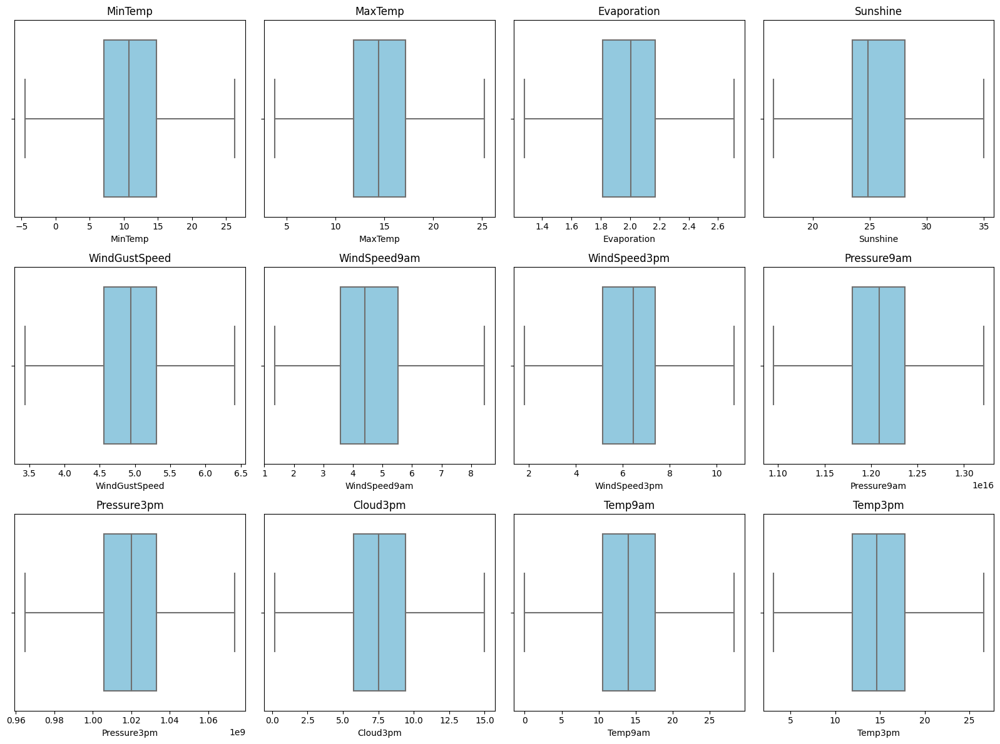

In [ ]:
#Checking outlier setelah melakukan handling
features = [col for col in Outlier]

features_count = len(features)
features_rows = (features_count // 4) + (features_count % 4)
fig, axes = plt.subplots(nrows=features_rows, ncols=4, figsize=(16, features_rows * 4))

axes = axes.flatten()

for i, column in enumerate(features):
    ax = axes[i]
    sns.boxplot(x=train[column].dropna(), ax=ax, color='skyblue')
    ax.set_title(column)

for i in range(features_count, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

In [ ]:
train.shape

(85253, 25)

---
## Exploratory Data Analysis (EDA)

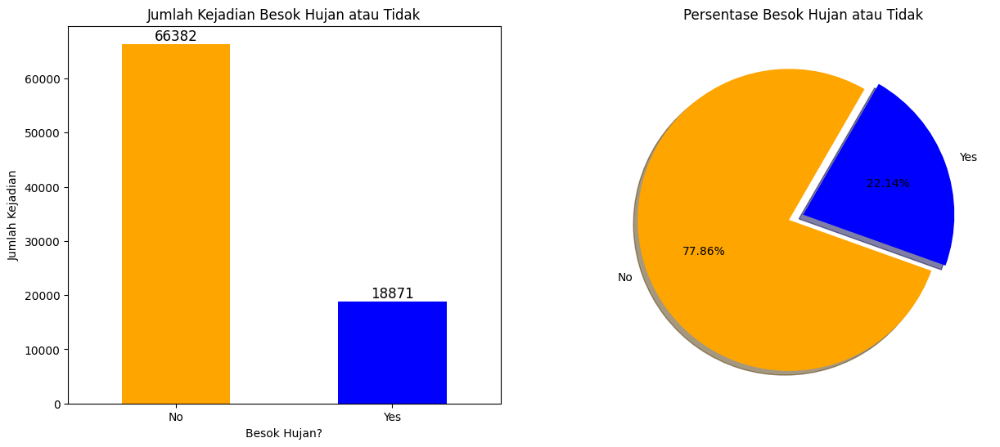

In [ ]:
RainTomorrow = train['RainTomorrow'].value_counts()

# Membuat dua subplot dalam satu gambar
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualisasi pertama: Bar plot
RainTomorrow.plot(kind='bar', color=['orange', 'blue'], ax=ax1)

for i, count in enumerate(RainTomorrow):
    ax1.text(i, count, str(count), ha='center', va='bottom', fontsize=12)

ax1.set_title('Jumlah Kejadian Besok Hujan atau Tidak')
ax1.set_xlabel('Besok Hujan?')
ax1.set_ylabel('Jumlah Kejadian')
ax1.set_xticks(range(len(RainTomorrow)))
ax1.set_xticklabels(RainTomorrow.index, rotation=0)

# Visualisasi kedua: Pie chart
Label = RainTomorrow.index
Sizes = RainTomorrow.values

ax2.pie(Sizes, explode=(0.1, 0), labels=Label, colors=['orange', 'blue'], autopct='%1.2f%%', shadow=True, startangle=60)
ax2.set_title('Persentase Besok Hujan atau Tidak')

# Menampilkan gambar
plt.show()

**Insight:**

Pada Visualisasi diatas terdapat 85.253 kejadian, yang dimana terdiri dari 22.14% atau sekitar 18.871 kejadian besok akan turun hujan dan 77.86% atau sekitar 66.382 kejadian besok tidak akan turun hujan. visualisasi tersebut menginformasikan distribusi prediksi cuaca diesok hari dan mayoritas dari prediksi, mengidentifikasi tidak adanya hujan pada esok hari

---

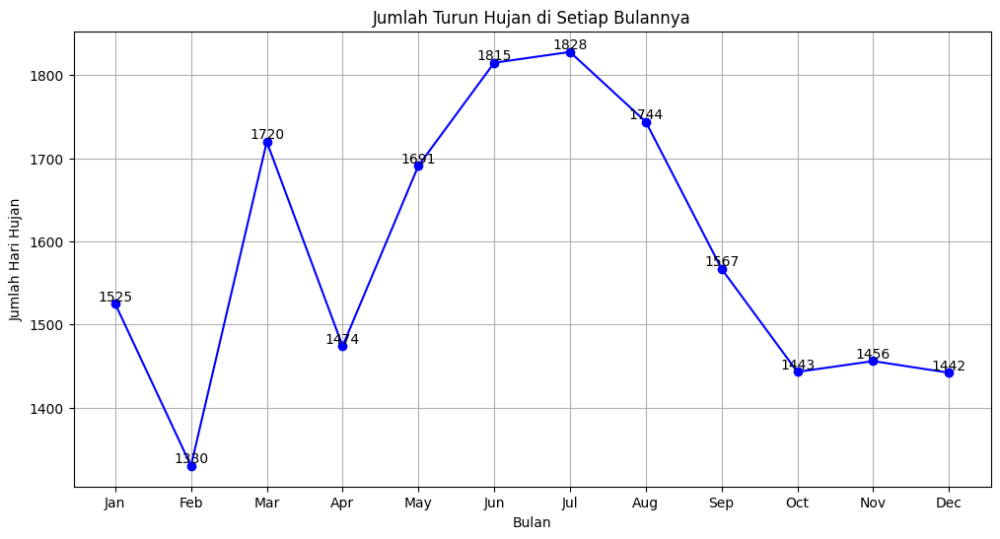

In [ ]:
# Menghitung jumlah hari dengan hujan (RainToday == 'Yes') setiap bulan
RainMonth = train[train['RainToday'] == 'Yes'].groupby('Month')['RainToday'].count()

# Membuat line chart
plt.figure(figsize=(12, 6))
plt.plot(RainMonth.index, RainMonth, marker='o', linestyle='-', color='blue')

# Menambahkan label pada titik data
for i, j in zip(RainMonth.index, RainMonth):
    plt.text(i, j, str(j), ha='center', va='bottom', fontsize=10)

plt.title('Jumlah Turun Hujan di Setiap Bulannya')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Hari Hujan')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

**Insight:**

Berdasarkan grafik tersebut, terlihat bahwa puncak turunnya hujan terjadi pada bulan Juli sekitar 1828 kali selama 10 tahun terakhir. Namun pada bulan Februari merupakan bulan terendah turunnya hujan yang berkisar hanya 1380 kali selama 10 tahun, sehingga menciptakan kontras yang signifikan antara dua bulan tersebut.

---

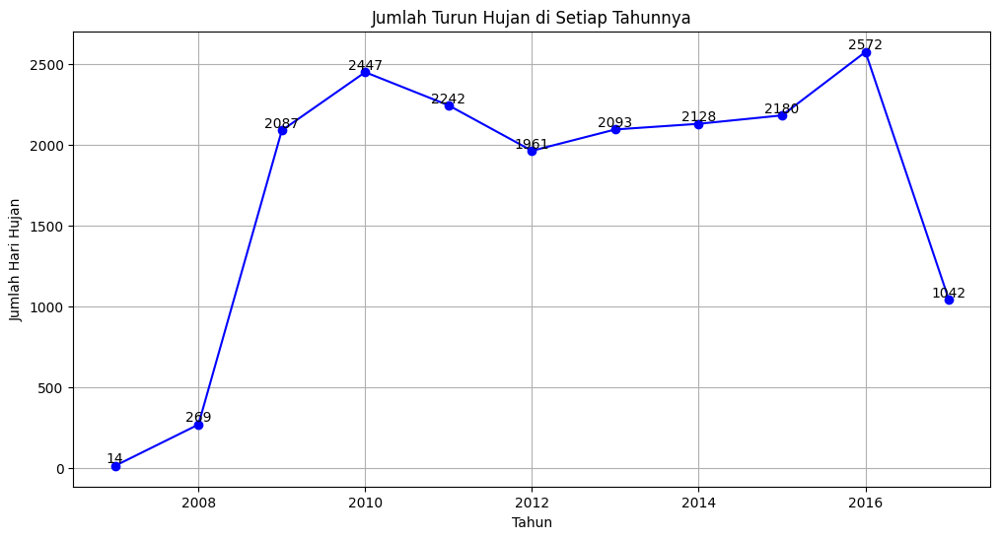

In [ ]:
# Menghitung jumlah hari dengan hujan (RainToday == 'Yes') setiap tahun
RainyYear = train[train['RainToday'] == 'Yes'].groupby('Year')['RainToday'].count()

# Membuat line chart
plt.figure(figsize=(12, 6))
plt.plot(RainyYear.index, RainyYear, marker='o', linestyle='-', color='blue')

# Menambahkan label pada titik data
for i, j in zip(RainyYear.index, RainyYear):
    plt.text(i, j, str(j), ha='center', va='bottom', fontsize=10)

plt.title('Jumlah Turun Hujan di Setiap Tahunnya')
plt.xlabel('Tahun')
plt.ylabel('Jumlah Hari Hujan')
plt.grid(True)
plt.show()

**Insight:**

Berdasarkan grafik line chart diatas, dapat diamati bahwa tahun 2016 melonjak sebagai tahun dengan jumlah turun hujan terbanyak dibandingkan tahun tahun sebelumnya, sementara pada tahun 2007 mencatat jumlah turun hujan yang terendah. Pembandingan antara dua tahun tersebut memberikan gambaran jelas tentang fluktuasi ekstrem dalam curah hujan selama 10 tahun.

---

In [ ]:
# Comparison Temp and Rain fall
fig = px.scatter(train, x='Temp9am', y='Temp3pm', color='Rainfall', hover_data=['Temp9am', 'Temp3pm', 'Rainfall'])
fig.update_layout(title='Comparison Temp and Rainfall')

fig.show()

In [ ]:
# Comparison Pressure and Rain fall
fig = px.scatter(train, x='Pressure9am', y='Pressure3pm', color='Rainfall', hover_data=['Pressure9am', 'Pressure3pm', 'Rainfall'])
fig.update_layout(title='Comparison Pressure and Rainfall')

fig.show()

---
## Measure of Central Tendency

In [ ]:
# Mengetahui nilai rata rata dari temp disetiap tahunnya
MeanTemp = train.groupby('Year')[['MinTemp', 'MaxTemp']].mean()
MeanTemp

,MinTemp,MaxTemp
Year,,
2007,10.790682,15.200862
2008,10.767899,14.416343
2009,10.875040,14.603205
2010,10.864168,14.260721
2011,10.850770,14.266878
2012,10.219021,14.179499
2013,10.674701,14.552441
2014,11.053559,14.812719
2015,10.859741,14.683930


In [ ]:
# Mengetahui nilai tengah dari atribut WindGustSpeed
MedianWindGustSpeed = train['WindGustSpeed'].median()
MedianWindGustSpeed

4.940695022162923

In [ ]:
# Mengetahui Location mana yang paling sering turun hujan
Rain = train[train['RainToday'] == 'Yes']
ModeLocation = train['Location'].mode()
ModeLocation

0    Darwin
Name: Location, dtype: object

**Insight Measure of Central Tendency**
- **Mean:** Rata-rata suhu minimum dan maksimum cenderung bervariasi setiap tahunnya. Pada tahun 2012, terjadi penurunan suhu yang signifikan baik dalam MinTemp dan MaxTemp, serta pada tahun 2017, terjadi peningkatan yang signifikan dalam MaxTemp.
- **Median:** Nilai tengah dari atribut WindGustSpeed yaitu **4.94**
- **Mode:** Lokasi yang sering turun hujan adalah lokasi Darwin.

---

## Measure of Spread

In [ ]:
# Menghitung range
min_rainfall = train['Rainfall'].min()
max_rainfall = train['Rainfall'].max()

print(min_rainfall, max_rainfall)

-0.0 0.6027260096076386


In [ ]:
# Menghitung measure of spread (deviasi standar)
rainfall_std = train['Rainfall'].std()
print(f'Standard Deviation of Rainfall: {rainfall_std}')

Standard Deviation of Rainfall: 0.23229174720271314


**Insight Measure of Spread**
- Range dari atribut rainfall atau curah hujan sekitar 0.0 mm hingga 0.6 mm.
- Hasil pengukuran penyebaran data pada atribut Rainfall melalui standard deviasi yaitu memiliki nilai sebesar  0.23229174720271314.

---

## Data Preprocessing

In [ ]:
# Replace function pada atribut bertipe object pada data train
train['RainToday'].replace({'No':0, 'Yes': 1}, inplace = True)
train['RainTomorrow'].replace({'No':0, 'Yes': 1}, inplace = True)

# Replace function pada atribut bertipe object pada data test
test['RainToday'].replace({'No':0, 'Yes': 1}, inplace = True)
test['RainTomorrow'].replace({'No':0, 'Yes': 1}, inplace = True)

In [ ]:
# Melihat jumlah atribut numeric pada data train
Num = train.select_dtypes(include=['number']).columns.tolist()
print('Jumlah atribut numeric : {}'.format(len(Num)))
print('Atribut numeric :', Num)

Jumlah atribut numeric : 21
Atribut numeric : ['Day', 'Month', 'Year', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']


In [ ]:
# Melihat jumlah atribut category pada data train
Cat = train.select_dtypes(include=['object','category']).columns.tolist()
print('Jumlah atribut categorical : {}'.format(len(Cat)))
print('Atribut categorical :', Cat)

Jumlah atribut categorical : 4
Atribut categorical : ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


### Checking Correlation

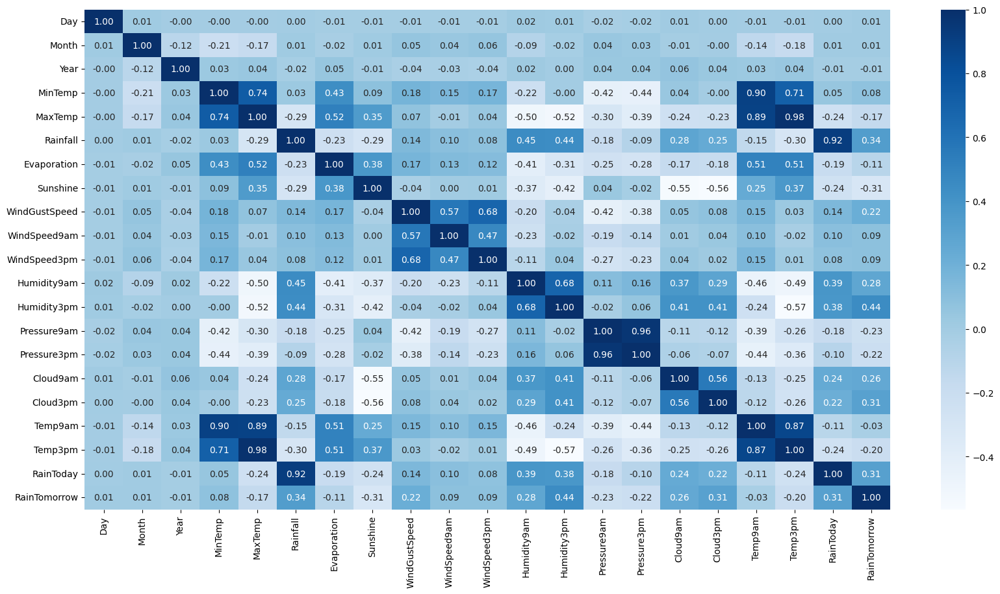

In [ ]:
plt.figure(figsize=(20, 10))
ax = sns.heatmap(train[Num].corr(), annot=True, fmt='.2f', cmap='Blues')

Dari hasil diatas terdapat beberapa atribut atau variabel yang memiliki korelasi positif terkuat dengan RainTomorrow, yaitu atribut Humidity3pm, Rainfall, RainToday, Cloud3pm, Humidity9am, WindGustSpeed, dan Cloud9am.

Maka dari itu untuk atribut - atribut yang tidak memiliki korelasi yang kuat pada raintomorrow, kami akan menghapusnya.

### Feature Selection

In [ ]:
train.drop(columns=['Day', 'Month', 'Year', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm'], inplace=True)
test.drop(columns=['Day', 'Month', 'Year', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm'], inplace=True)

print('Training set size:', train.shape)
print('Test set size:', test.shape)

Training set size: (85253, 12)
Test set size: (36537, 12)


In [ ]:
train.head()

,Location,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
43831,Wollongong,0.257844,S,4.392045,SW,S,335.118066,40.430474,12.430572,13.527863,0,0
20804,NorahHead,-0.000000,NNE,4.660086,WSW,NE,302.484968,38.273540,7.050248,7.530028,0,0
1949,Albury,0.411895,WNW,5.300931,NW,WNW,535.410176,48.356555,12.430572,13.527863,0,0
111912,Witchcliffe,0.583622,WSW,4.940695,WSW,SW,302.484968,34.998667,7.050248,7.530028,1,0
94903,Townsville,-0.000000,ENE,5.026294,NNW,ENE,222.628932,31.671158,0.000000,0.174696,0,0


### Encode Data Category

In [ ]:
Category = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']

combined_df = pd.concat([train, test])
combined_df = pd.get_dummies(combined_df, columns=Category)

train = combined_df[:len(train)]
test = combined_df[len(train):]

In [ ]:
print('Training set size:', train.shape)
print('Test set size:', test.shape)

Training set size: (85253, 103)
Test set size: (36537, 103)


In [ ]:
X_train = train.drop('RainTomorrow', axis=1)
y_train = train['RainTomorrow']

X_test = test.drop('RainTomorrow', axis=1)
y_test = test['RainTomorrow']

### Scaling Data Numeric

In [ ]:
sc = MinMaxScaler()
Numeric = ['Rainfall', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'RainToday']

X_train[Numeric] = sc.fit_transform(X_train[Numeric])
X_test[Numeric] = sc.transform(X_test[Numeric])

### Handling Oversampling

In [ ]:
os = SMOTE()
X_train, y_train = os.fit_resample(X_train, y_train)
count = Counter(y_train)
print(count)

Counter({0: 66382, 1: 66382})


---
## Data Modelling

### Model Logistic Regression
Alasan menggunakan algoritma logistic regression dikarenakan algoritma tersebut dapat memberikan hasil yang mudah untuk diinterpretasikan, cocok untuk kasus yang dimana hubungan antara variabel independen dan dependen dapat diaproksimasi dengan fungsi linear, dan algoritmanya lebih sederhana serta logistic regression dapat memberikan output dalam bentuk probabilitas.

In [ ]:
Logistic = LogisticRegression()
Logistic.fit(X_train, y_train)

LogisticRegression()

In [ ]:
pred_logistic = Logistic.predict(X_test)
Accuracy_Logistic = accuracy_score(y_test, pred_logistic)
print('Akurasi:', Accuracy_Logistic)

Akurasi: 0.8367134685387415


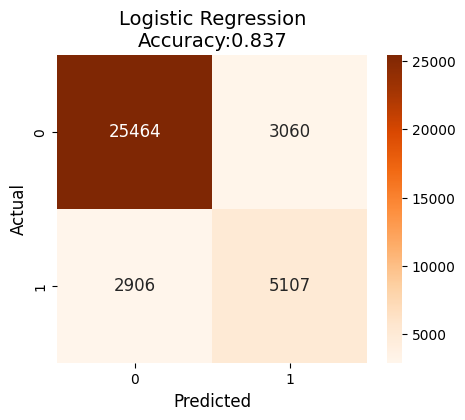

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.89      0.90     28524
           1       0.63      0.64      0.63      8013

    accuracy                           0.84     36537
   macro avg       0.76      0.77      0.76     36537
weighted avg       0.84      0.84      0.84     36537



In [ ]:
#Confussion Logistic Regression
cm = confusion_matrix(y_test, pred_logistic)

# Membuat heatmap untuk confusion matrix
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='.0f', cmap='Oranges', annot_kws={'fontsize':12})
plt.title('Logistic Regression\nAccuracy:{:.3f}'.format(accuracy_score(y_test, pred_logistic)), fontsize=14)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

# Menampilkan Classification Report
print('Classification Report:\n', classification_report(y_test, pred_logistic))

### Model Support Vector Machine (SVM)
Alasan menggunakan algoritma SVM dikarenakan, algoritma tersebut dapat menangani masalah klasifikasi non-linear melalui penggunaan fungsi kernel, memungkinkan pemodelan yang lebih kompleks untuk memberikan performa yang baik dalam mengatasi overfitting dan umumnya memiliki ketahanan yang baik terhadap outlier serta Efektif dalam ruang fitur berdimensi tinggi, yang membuat SVM menjadi pilihan yang baik untuk data dengan banyak fitur.

In [ ]:
Support = SVC()
Support.fit(X_train, y_train)

SVC()

In [ ]:
pred_support = Support.predict(X_test)
Accuracy_Support = accuracy_score(y_test, pred_support)
print('Akurasi:', Accuracy_Support)

Akurasi: 0.8495224019487095


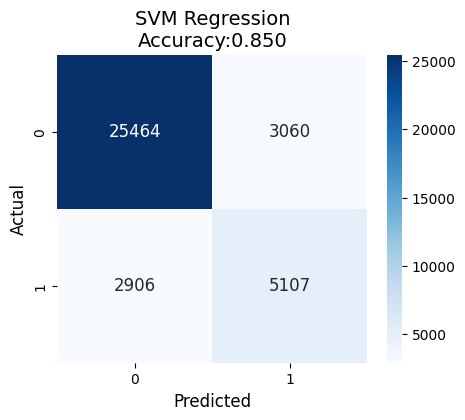

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.90     28524
           1       0.67      0.61      0.64      8013

    accuracy                           0.85     36537
   macro avg       0.78      0.76      0.77     36537
weighted avg       0.84      0.85      0.85     36537



In [ ]:
#SVM Regression
cm2 = confusion_matrix(y_test, pred_support)

# Membuat heatmap untuk confusion matrix
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True,fmt='.0f', cmap='Blues', annot_kws={'fontsize':12})
plt.title('SVM Regression\nAccuracy:{:.3f}'.format(accuracy_score(y_test, pred_support)), fontsize=14)
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.show()

# Menampilkan Classification Report
print('Classification Report:\n', classification_report(y_test, pred_support))

---
---
## **CONCLUSION**

Dari analisis diatas dapat diambil beberapa kesimpulan:
1. Dari atribut yang ada, diambil hanya atribut yang paling berpengaruh diantaranya yaitu:
2. Dalam menguji, kami menggunakan 2 metode algoritma yaitu: Logistic Regression dan Support Vector Machine (SVM), masing masing model algoriitma tersebut memiliki nilai akurasi yang hampir sama yaitu 83% dan 85%.
3. Dari kedua algoritma tersebut, algoritma yang lebih direkomendasikan untuk memprediksi cuaca besok apakah hujan atau tidak adalah algoritma **Logistic Regression**. dikarenakn proses pelatihannyanya tidak membutuhkan daya komputasi yang besar dan waktu yang singkat dibandingkan dengan metode algoritma SVM.

---
---